# Modeling Baryonic Feedback

While this Nbody simulation is mostly meant as a treatment of Dark Matter particles, a key part of our Universe is the part we can see: baryons.
Nbody cosmological simulations have existed for decades, yet they overproduce massive galaxies.
Decades of research has gone into getting mass *out* of galaxies.


This is my attempt of getting mass out of galaxies

## Background

Broadly speaking there are two different types/modes of feedback: 

1. Gentle Feedback
2. Bursty Feedback

The difference between gentle and bursty feedback is two-fold: (i) the strength of feedback and (ii) how long it lasts.
Burtsy feedback is a strong burst driven by stellar explosions.
The bursts categorically blow-out galaxies (particularly at low mass and high redshift), which can be seen in, e.g., metallicity gradients of galaxies (see below, from Garcia et al. In Prep).

![title](img/feedback.png)

The left hand-side is a galaxy at redshift 5 in IllustrisTNG (gentle feedback) and the right is a similar galaxies at the same redshift (and mass-matched) in the FIRE model (bursty feedback). 
The left have a well-ordered disk at z=5, but the right is completely blown-out

In [1]:
import read_Cosmo_Nbody as rcn

## The Experiment

**Quick note on merger setup** 

In order to get something that converges reasonably well, we make a modification to the original code.
When a particle wraps around the box, we reduce its velocity by a factor of 2.
The wrapping makes less sense in a zoom-in type simulation; therefore, even though this is unphysical, we can pretend a low-velocity particle is infalling from the, e.g., IGM

### Fiducial Code

In [2]:
fiducial = rcn.Particle('./output/test3_no_fb/','./TestThreeParams')
fiducial.make_movie(projection='xy')

Found: 
	500  particles
	3    dimensions
	1000 snapshots


More quantitatively, let's look at the dispersion (standard deviation of the positions) in the X, Y, and Z planes for this box.

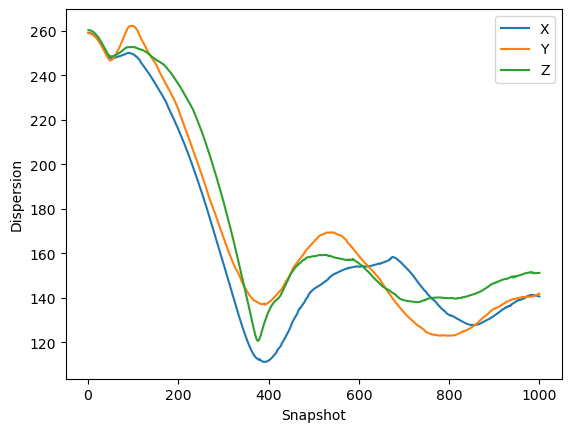

In [3]:
fiducial.dispersion_plot()

The dispersion decreases pretty significantly until around snapshot 400 (which is the merger event itself). 
From there the dispersion picks up a little bit from particles passing through, but then comes back down around snapshot 800. 
This oscillatory behavior would likely repeat until the system comes to some sort of steady state at large snapshot numbers

### Gentle Feedback

In [4]:
gentle = rcn.Particle('./output/test3_gentle_fb/','./TestThreeParams')
gentle.make_movie(projection='xy')

Found: 
	500  particles
	3    dimensions
	1000 snapshots


Let's look at the dispersion in the gentle feedback case

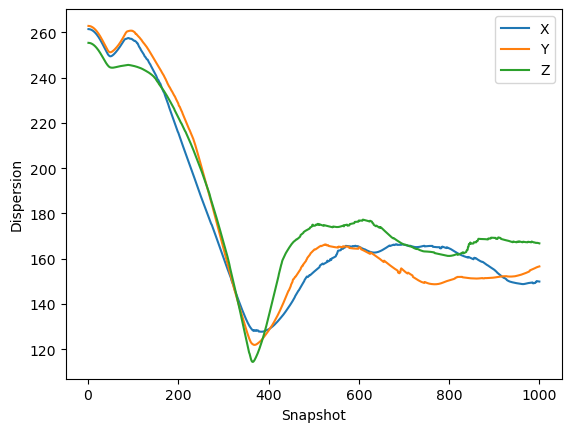

In [5]:
gentle.dispersion_plot()

We again see that the dispersion systematically decreases until snapshot 400, where the two systems interact.
There is a peak immediately after the interaction here, too. 
However, now the dispersion remains relatively consistent through the rest of the simulation. 
This is our baryonic feedback prescription applying an additional radial force away from the center of mass preventing the dispersion from getting lower.

Instead of coming to some steady-state solution over some timescale, we are forcing our system to come to some steady state much earlier.
If the system gets dense, it will form stars, which will drive out some energy* stablizing the system from collapse.
In esscense, this is a 0th order effective equation of state -- see, e.g., [Springel & Hernquist (2003)](https://ui.adsabs.harvard.edu/abs/2003MNRAS.339..289S/abstract) or [Schaye & Dalla Vecchia (2008)](https://ui.adsabs.harvard.edu/abs/2008MNRAS.383.1210S/abstract).

We've pressurized the system against collapse



*The system should also drive out momentum, but since we're modeling collisionless particles this is neglected

### Strong Feedback

In [6]:
strong = rcn.Particle('./output/test3_strong_fb/','./TestThreeParams')
strong.make_movie(projection='xy')

Found: 
	500  particles
	3    dimensions
	1000 snapshots


Again, let's take a look at the dispersion

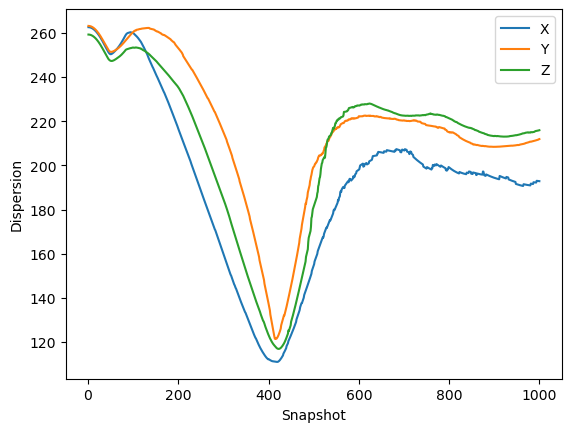

In [7]:
strong.dispersion_plot()

The merger takes place at snapshot 400, again, followed by an increase in the dispersion.
Now, since our feedback is much stronger, it increases the dispersion to levels nearly seen at the beginning of the simulation.
The video shows that the galaxy is almost entirely gone at these late times and the dispersion plots show this as well.

We again see that we drive the system to some steady state.
Here, though, we ensure that the steady state is a much less dense ISM.
In fact, the galaxy is basically destroyed by our feedback.

## Is this physical?

Is our exact prescription physical? Probably not.
However, bursty feedback in simulations is an active area of research; even extreme bursts.
For example, see the video below from the FIRE simulations (e.g., [Hopkins et al. 2014](https://ui.adsabs.harvard.edu/abs/2014MNRAS.445..581H/abstract))

http://www.tapir.caltech.edu/~phopkins/Site/m12_hr_sep10_2013_both_720p.mp4

## Core-Cusp

Bursty feedback is a mechanism that can be used to explain the core-cusp problem in Cosmology as well.
Let's investigate how our feedback model impacts the density of the particles as a function of distance from the center of mass of the halo

In [8]:
import matplotlib.pyplot as plt

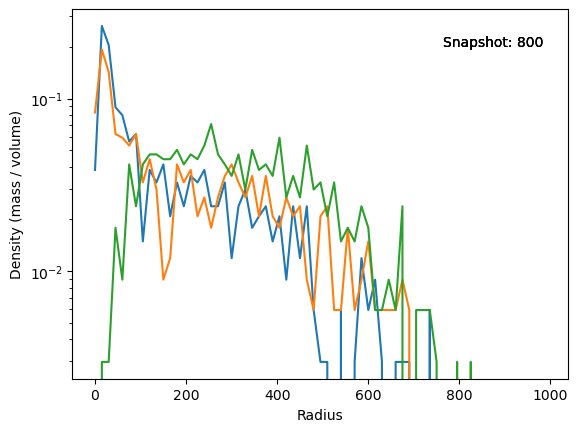

In [9]:
snap = 800 ## snapshot looking at
sep = 15 ## Window for density average (needs to be high, but not too high)

fiducial.density_profile(snap=snap,sep=sep)
gentle.density_profile(snap=snap,sep=sep)
strong.density_profile(snap=snap,sep=sep)
plt.yscale('log')
plt.show()

While the feedback scheme employed from our model is a bit extreme (e.g., completely destroying the galaxy after snapshot 400), we see the desired effect -- we've removed matter from the central part of the galaxy with only baryonic feedback.


This result, while not well-resolved, is consistent with results of [Moore (1994)](https://ui.adsabs.harvard.edu/abs/1994Natur.370..629M/abstract)